# Image Search Based on a Natural Language Query Using CLIP Model

In this notebook, we implement a simople image search solution based on a natural language query using the CLIP model [1]. We use CLIP to pre-calculate embeddigns for images in a collection. For a given query, we calculate its embedding using CLIP and then search for the nearest neighbors in the collection of image embeddigns. 

The implementation is based on [2].

### References
  1. https://openai.com/blog/clip/#rf33
  2. https://github.com/haltakov/natural-language-image-search
  
### Data
We use a small image collection available in the `tensorhouse-data` repository (`tensor-house-data/search/unspash-small`).

## Load the CLIP Model

In [1]:
import clip
import torch
import math
import numpy as np
import pandas as pd

from PIL import Image
import shutil
import os

import matplotlib.pyplot as plt
plt.rcParams.update({'pdf.fonttype': 'truetype'})
from mpl_toolkits.axes_grid1 import ImageGrid

## Load CLIP Model

In [2]:
#
# Load the open CLIP model
#
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

In [3]:
from pathlib import Path

# Define the path to check
images_path = Path('/Users/tanayparikh/Desktop/Assignment-4/img/MEN/Sweatshirts_Hoodies')

if images_path.exists() and images_path.is_dir():
    print(f"The path {images_path} exists and is a directory.")
else:
    print(f"The path {images_path} does not exist or is not a directory.")


The path /Users/tanayparikh/Desktop/Assignment-4/img/MEN/Sweatshirts_Hoodies exists and is a directory.


## Process Input Images and Save Features

Images found in Jackets_Vests: 424


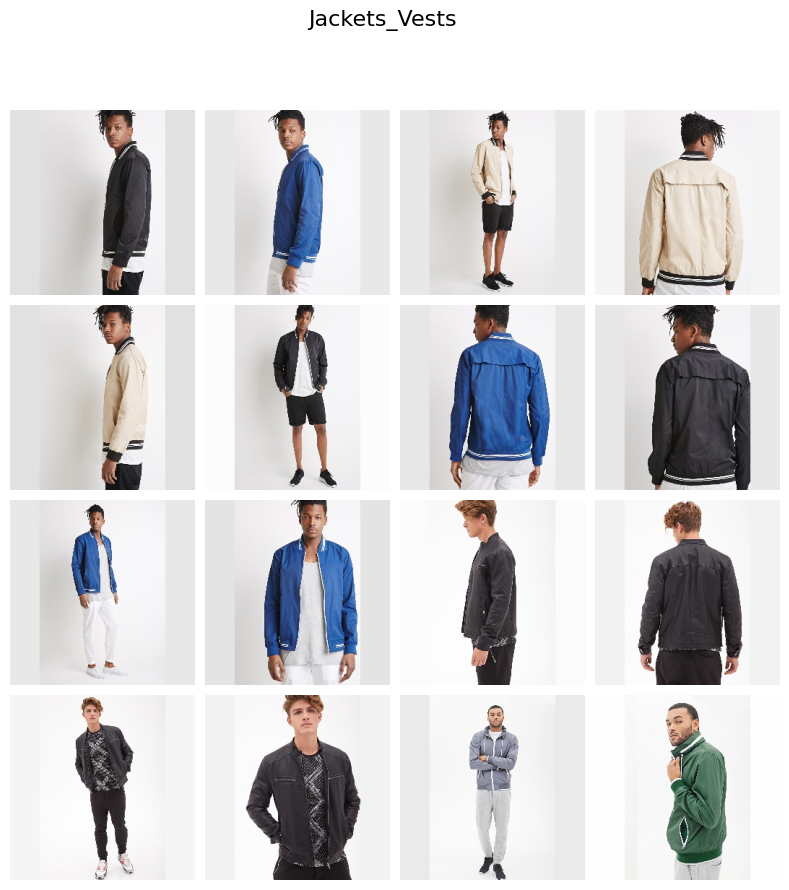

Images found in Pants: 1017


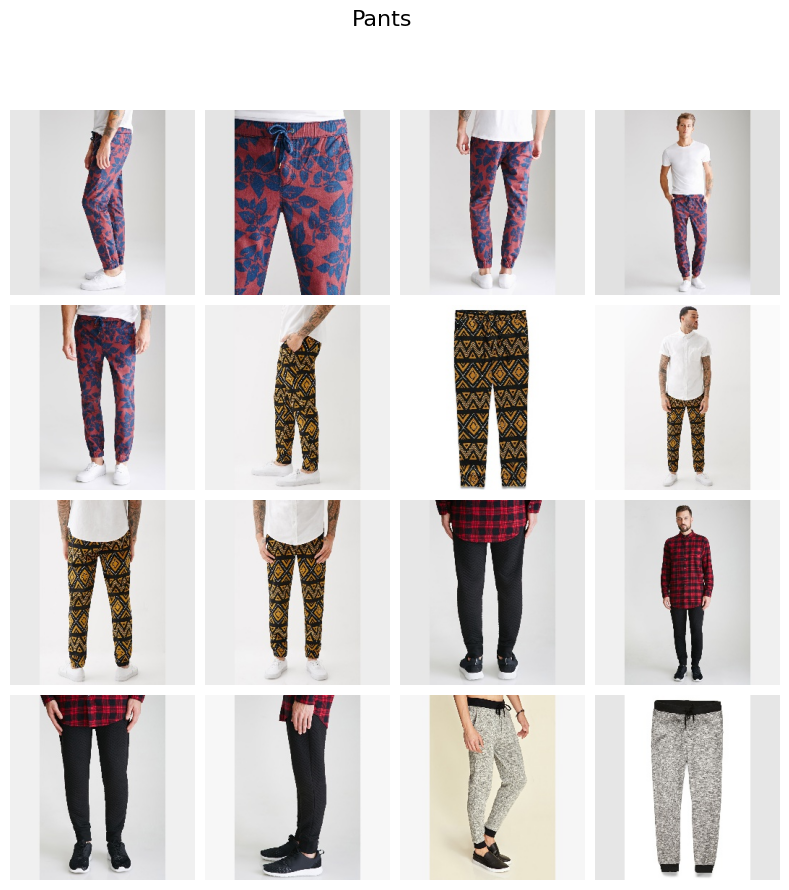

Images found in Tees_Tanks: 2845


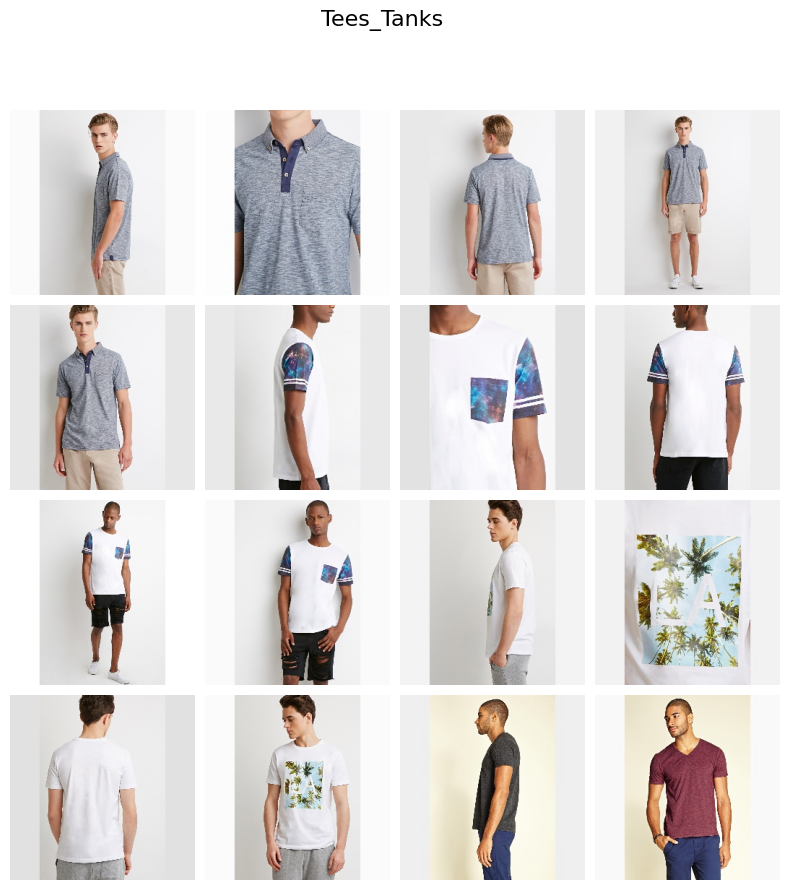

Images found in Shirts_Polos: 722


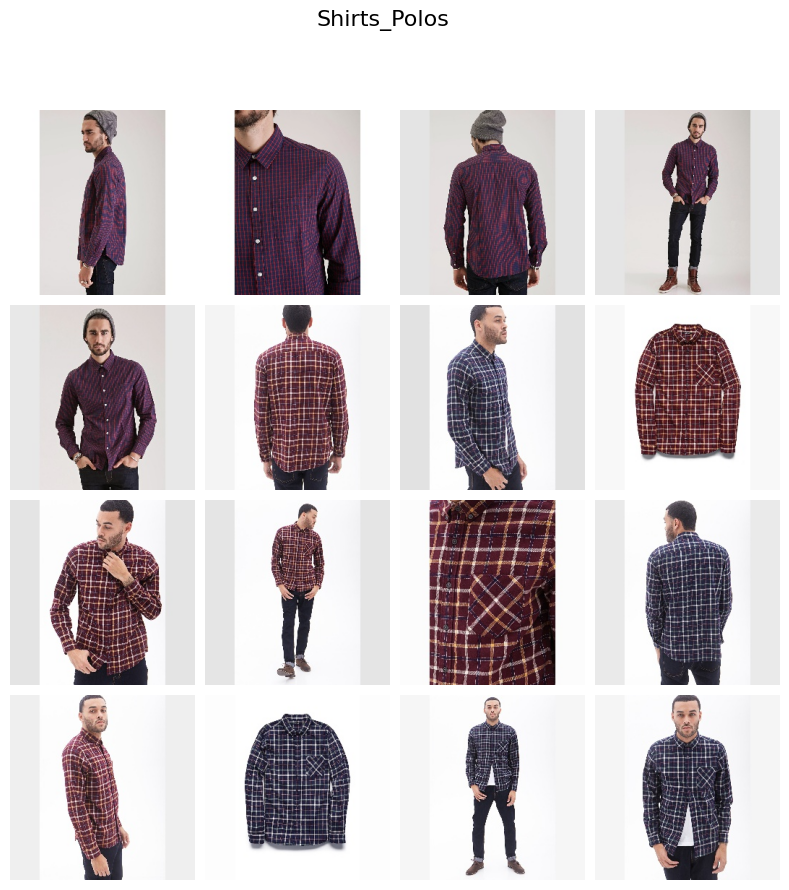

Images found in Shorts: 1000


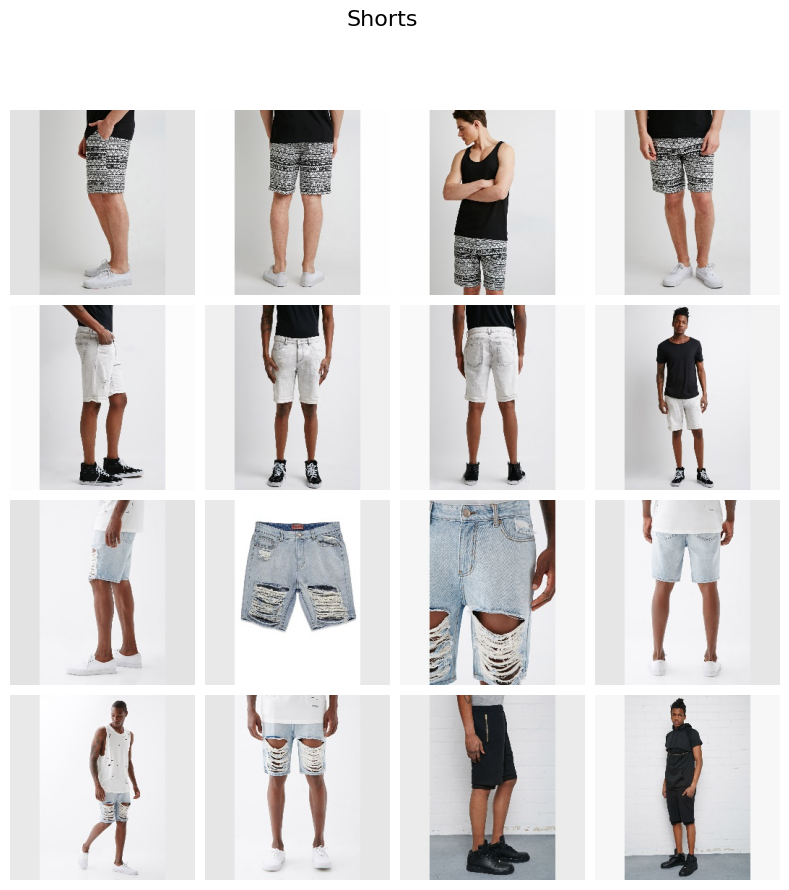

Images found in Sweaters: 605


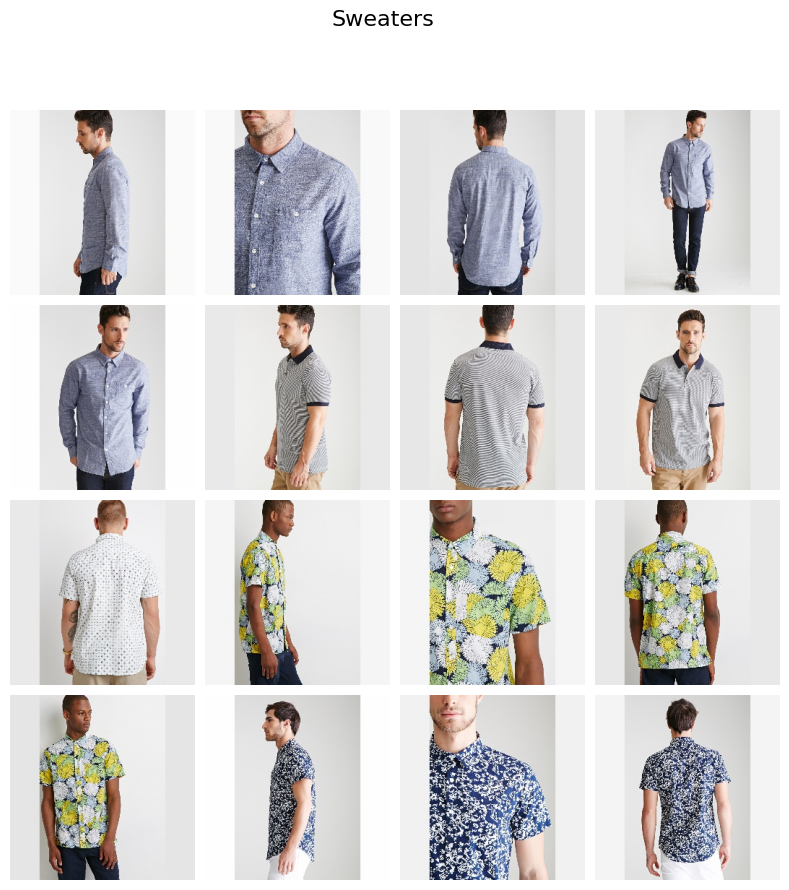

Images found in Denim: 411


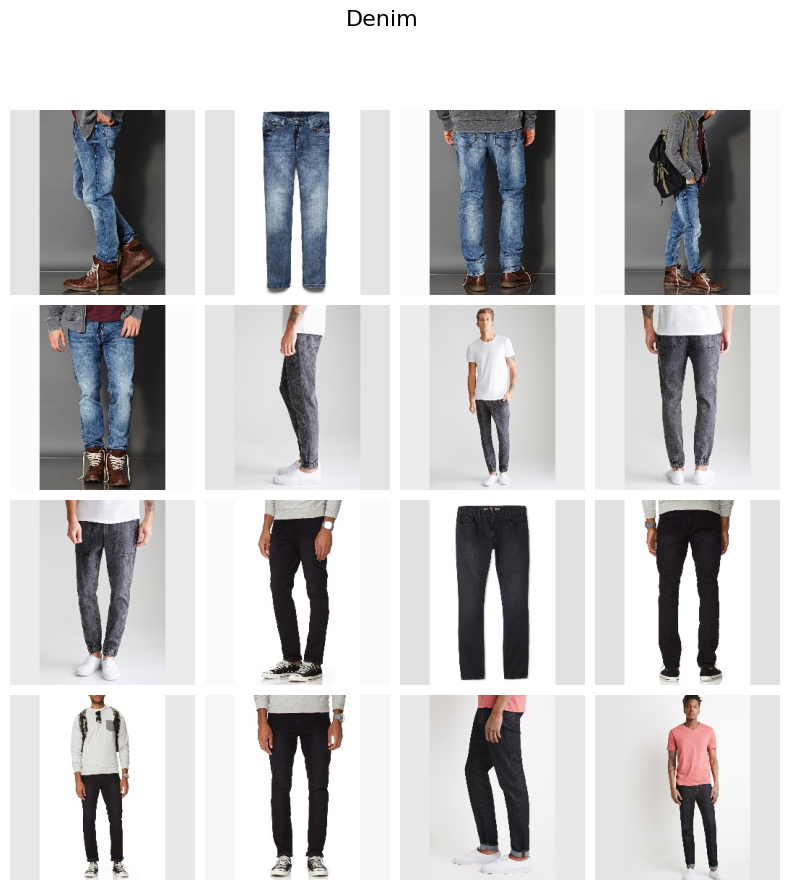

Images found in Suiting: 39


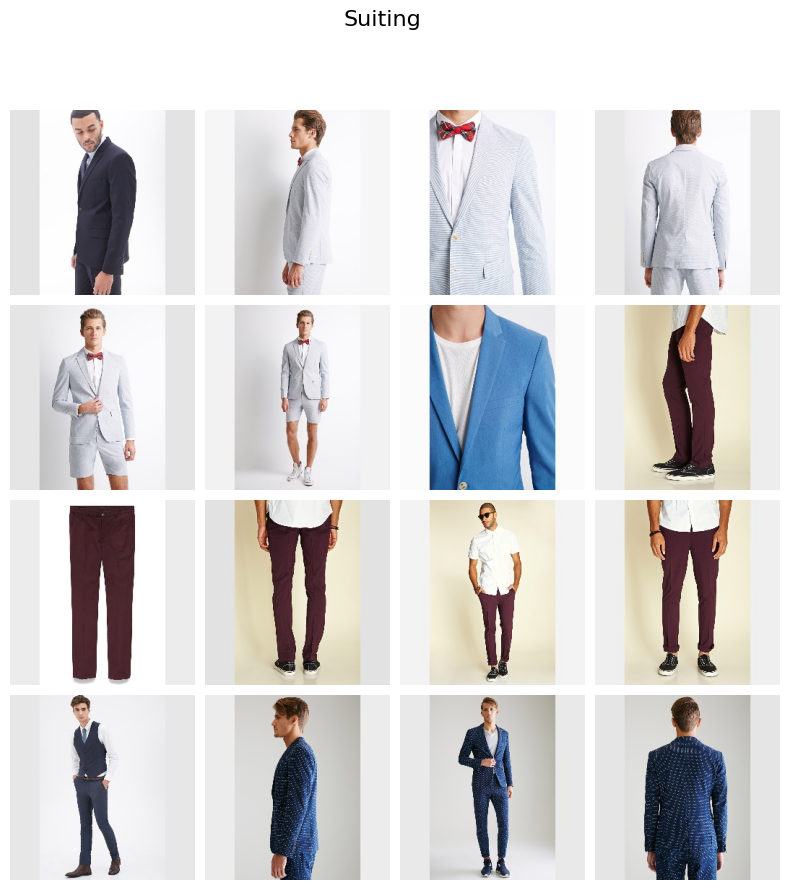

Images found in Sweatshirts_Hoodies: 775


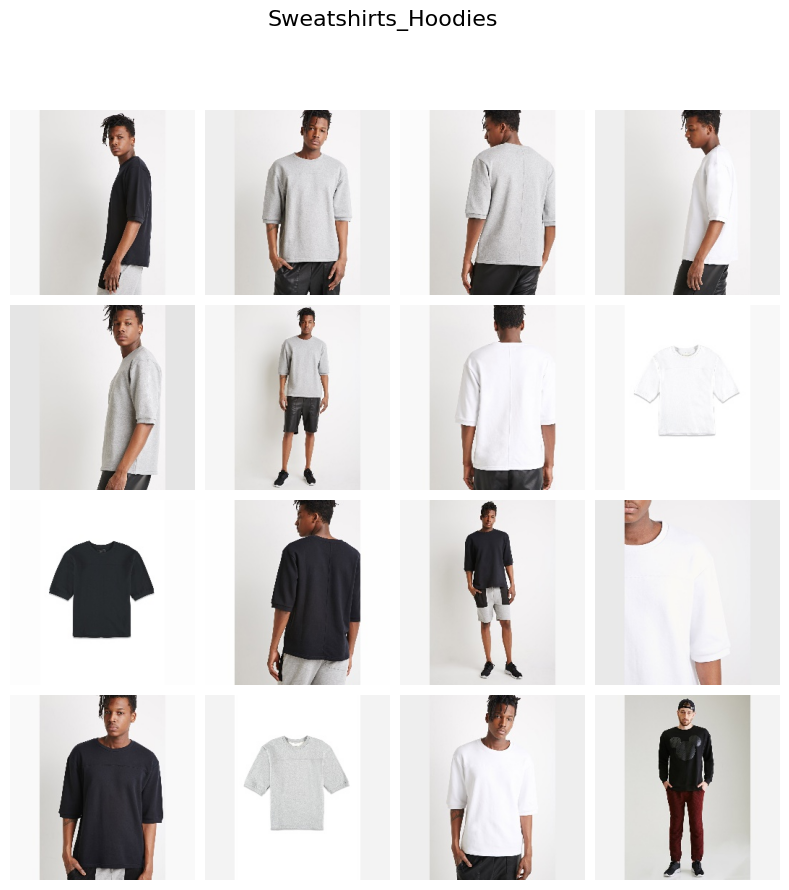

Images found in Jackets_Coats: 1895


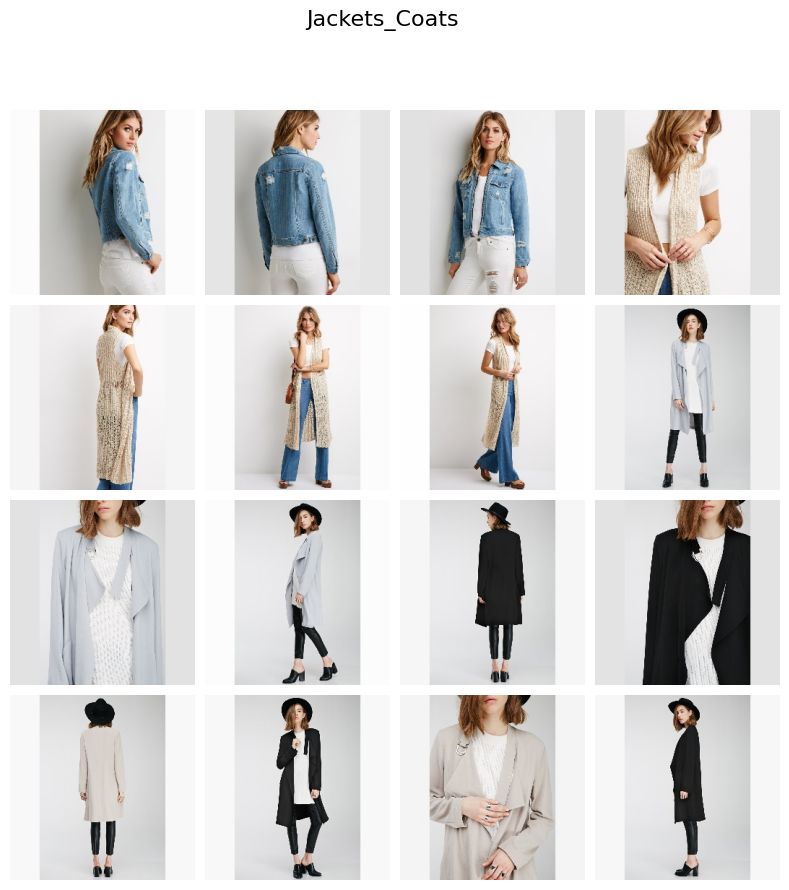

Images found in Blouses_Shirts: 7964


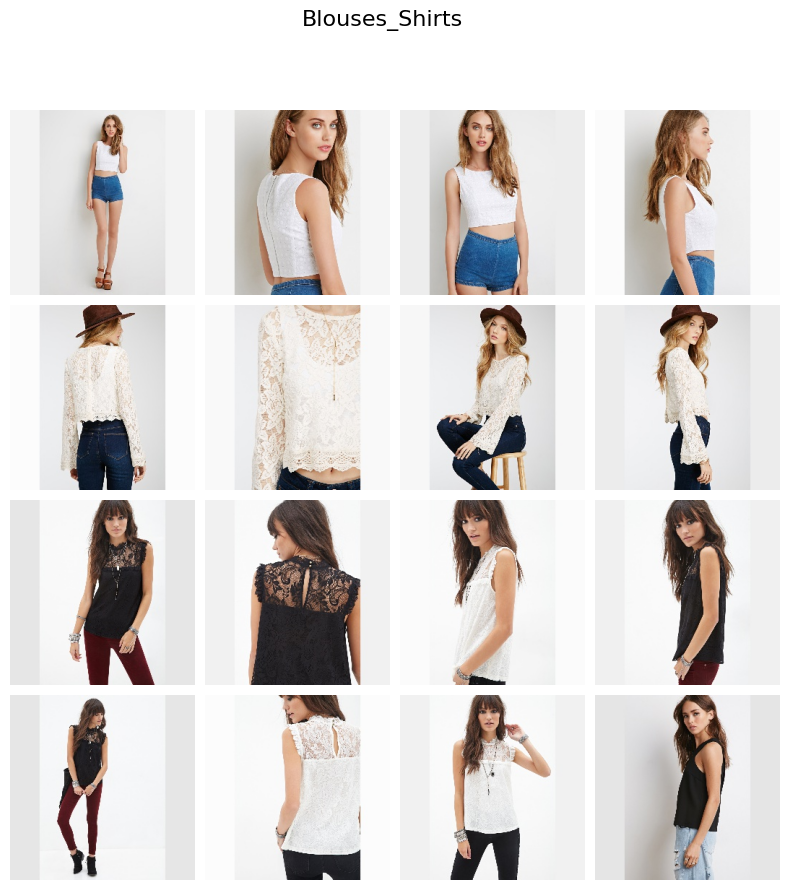

Images found in Skirts: 2045


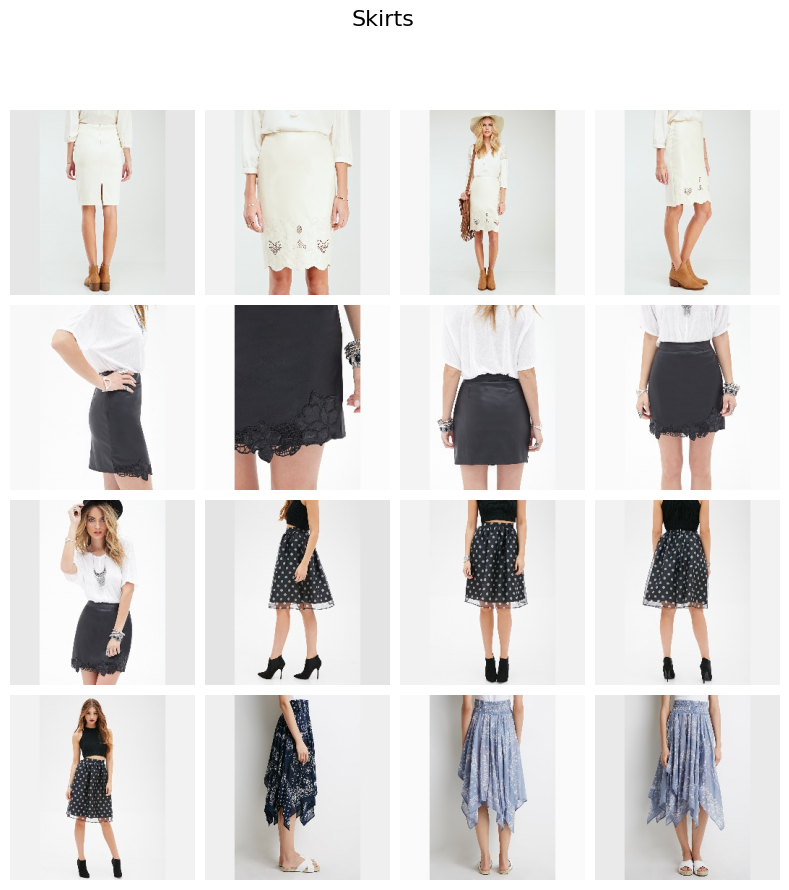

Images found in Rompers_Jumpsuits: 1696


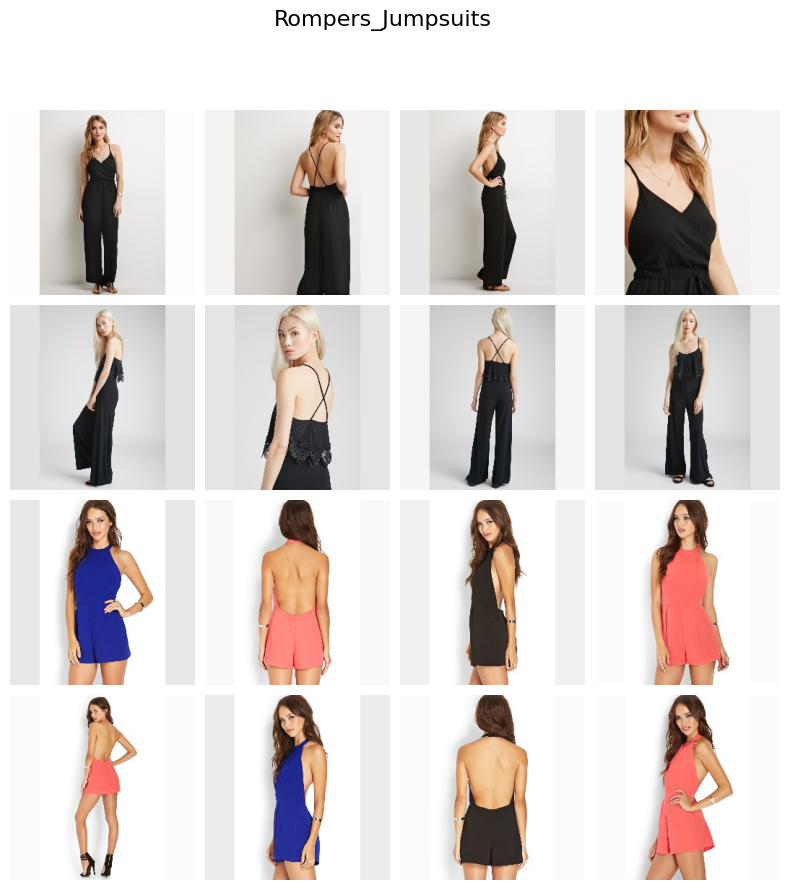

Images found in Dresses: 6999


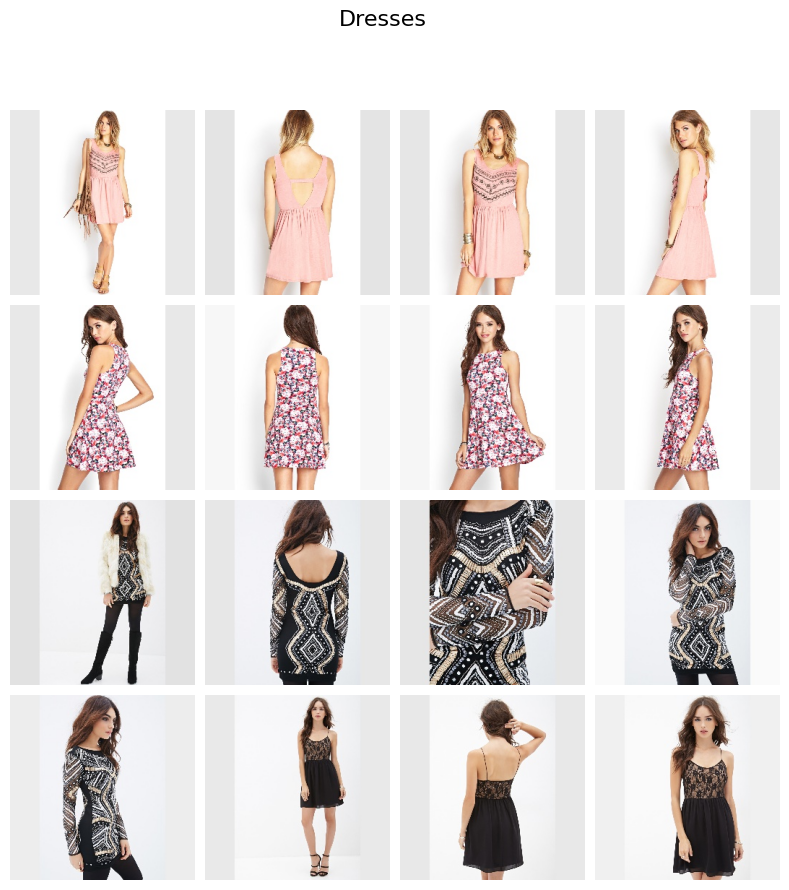

Images found in Pants: 1804


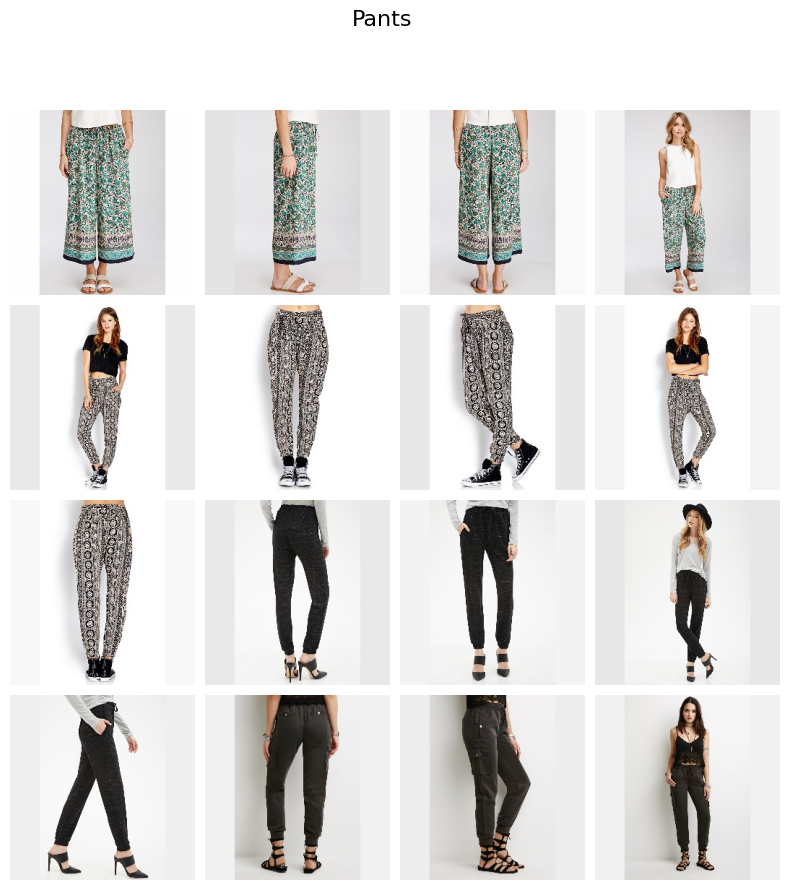

Images found in Tees_Tanks: 11642


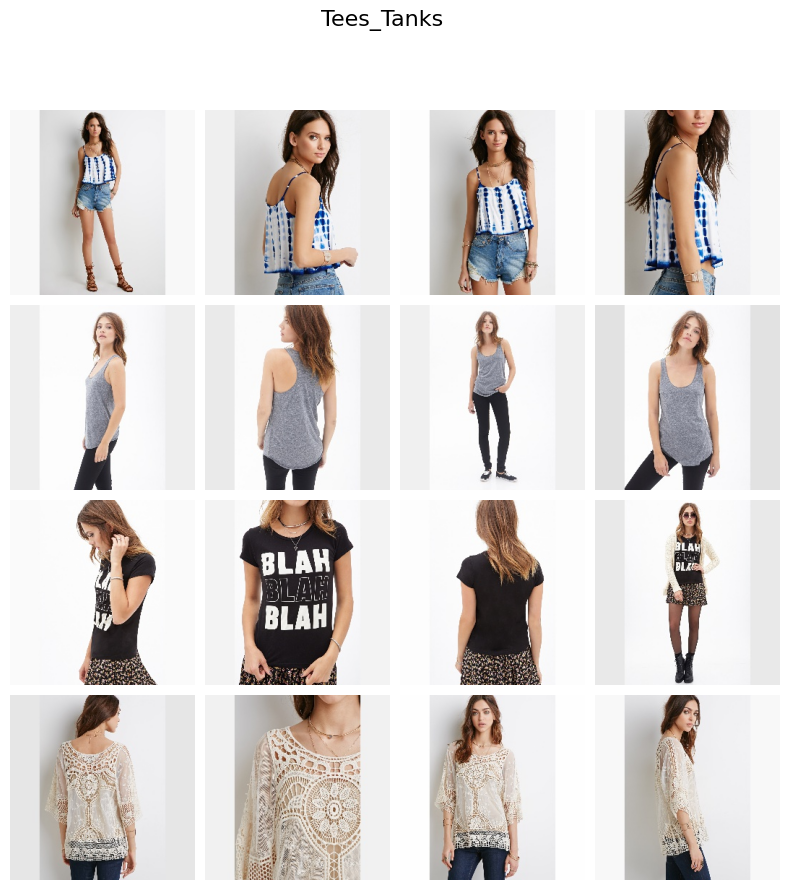

Images found in Shorts: 3476


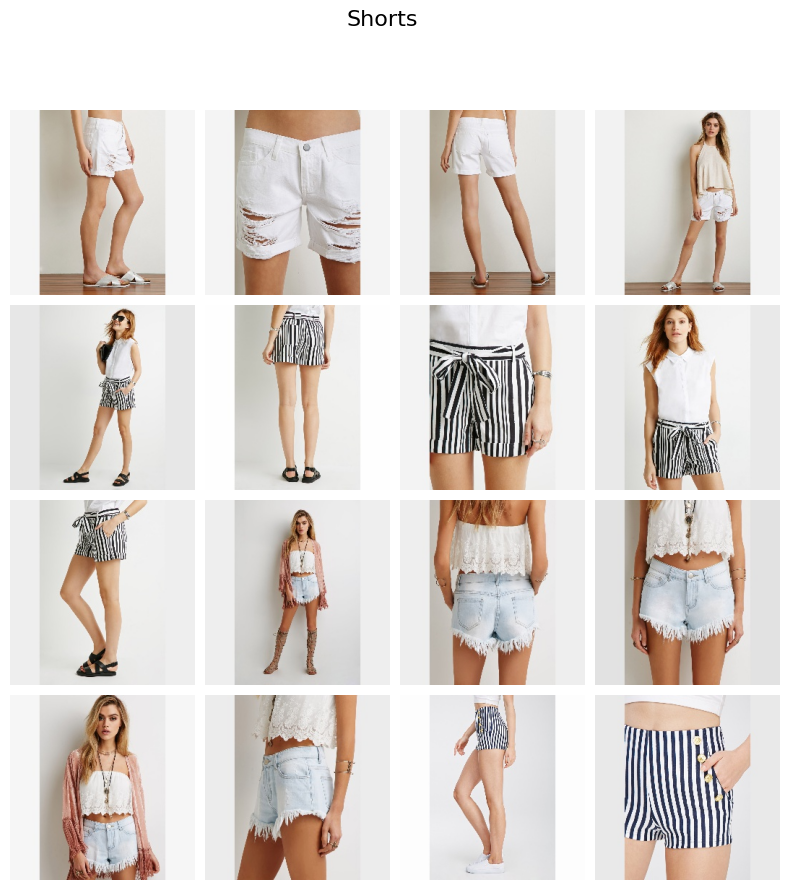

Images found in Sweaters: 3036


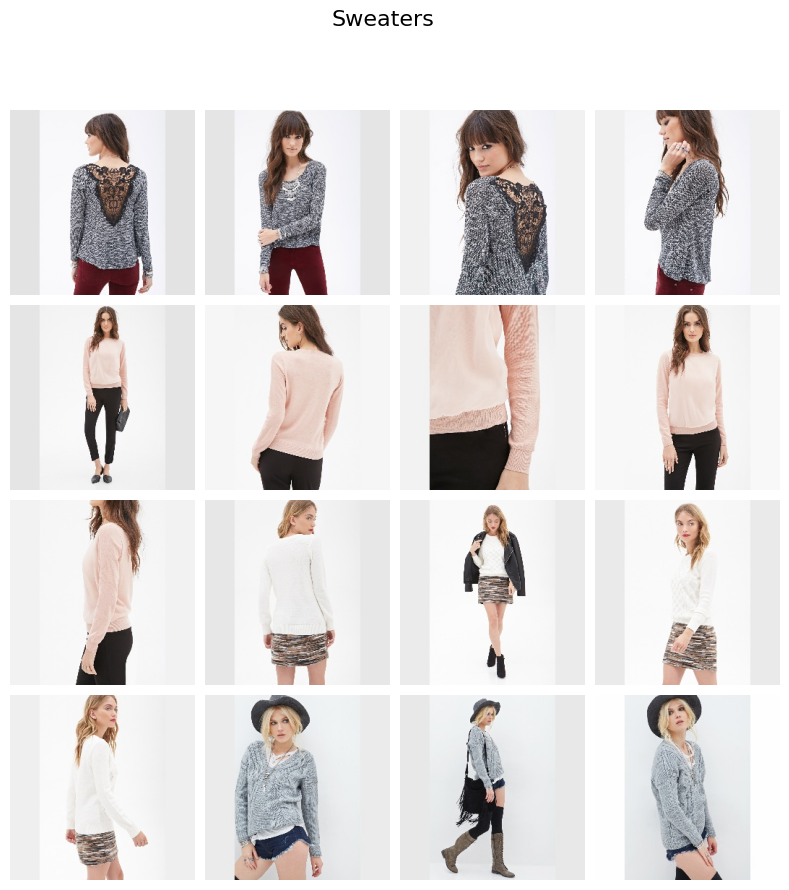

Images found in Leggings: 335


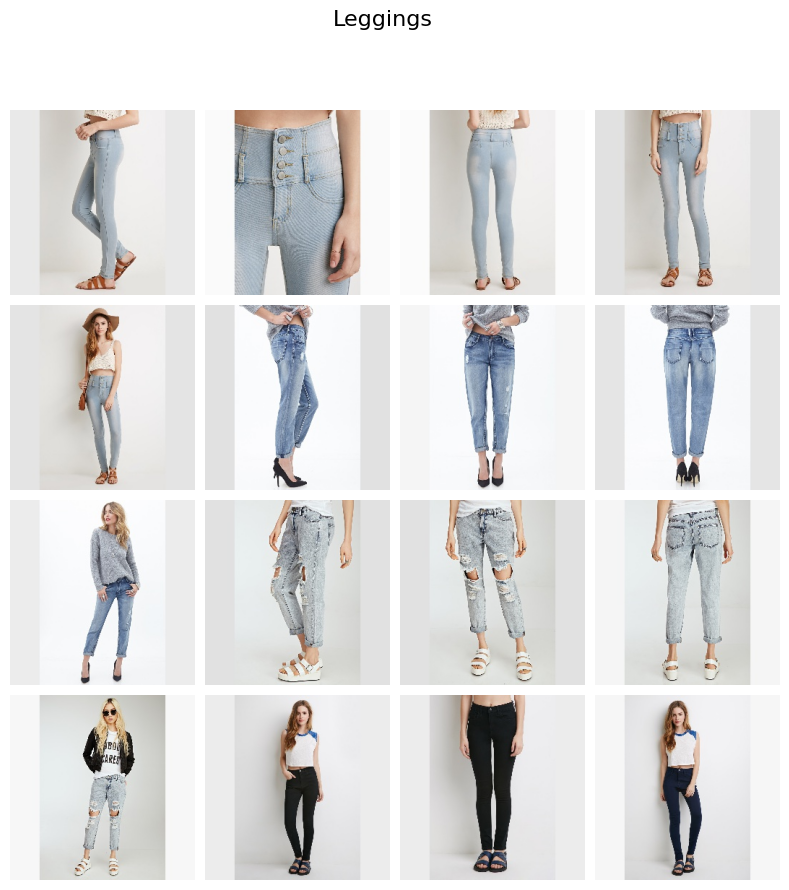

Images found in Denim: 393


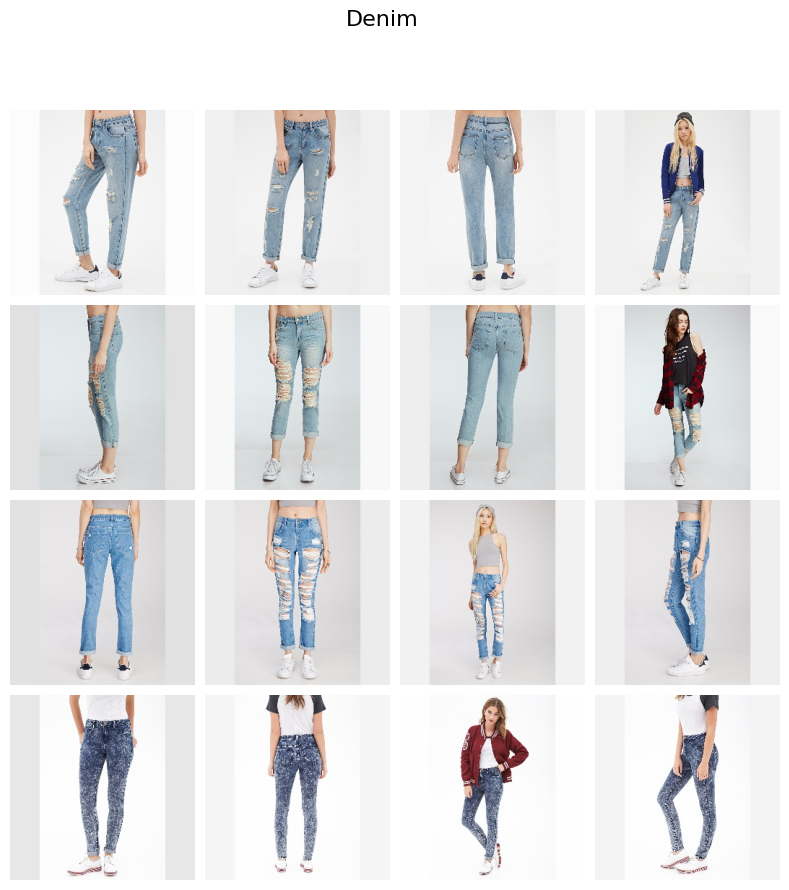

Images found in Sweatshirts_Hoodies: 856


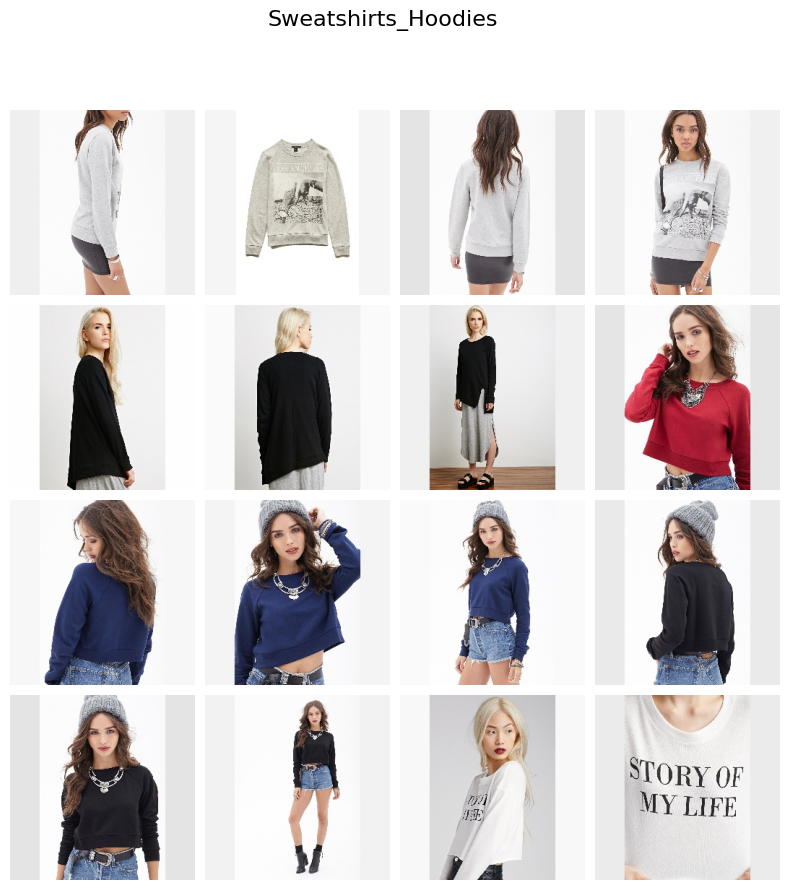

Images found in Cardigans: 1436


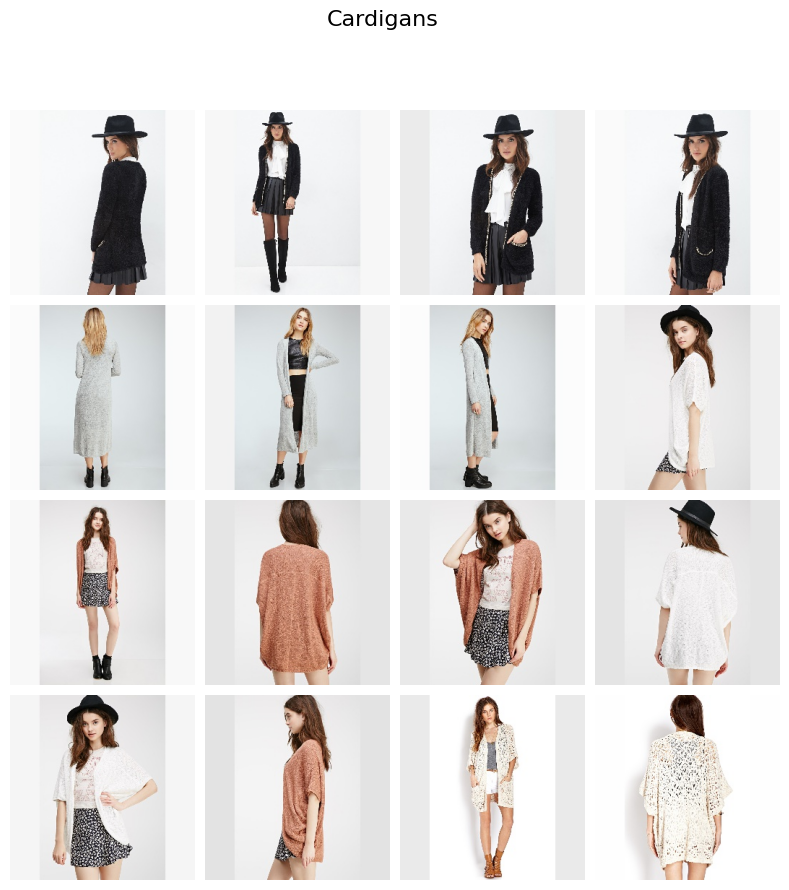

Images found in Graphic_Tees: 1297


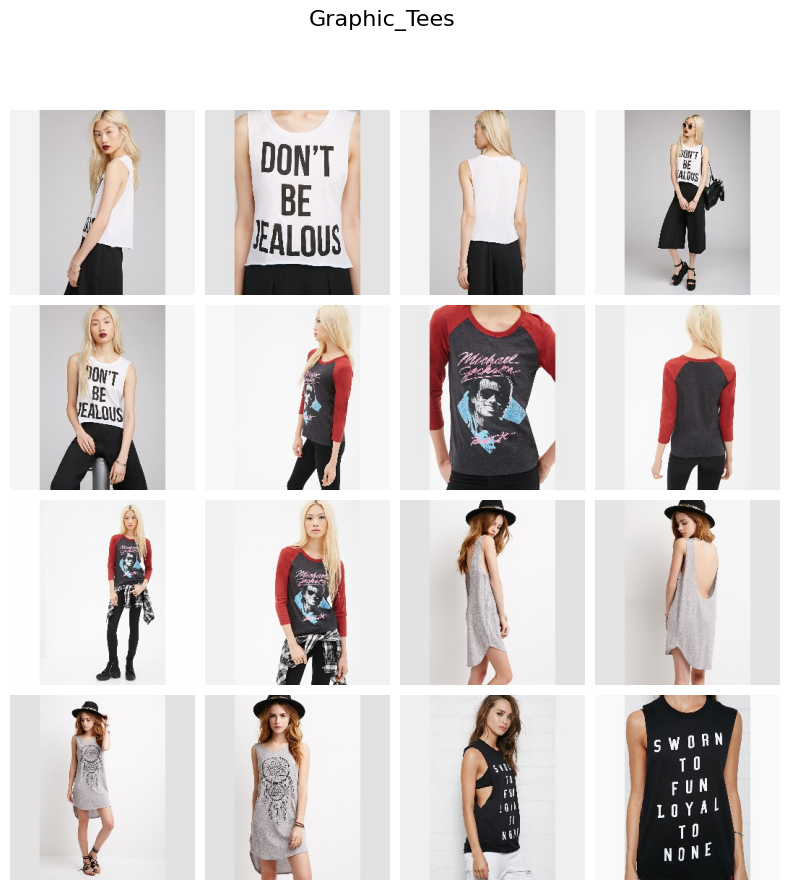

In [4]:
from pathlib import Path
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from PIL import Image

# Set the path to the root folder containing subfolders with images
root_path = Path('/Users/tanayparikh/Desktop/Assignment-4/img')

# List main folders (men and women)
main_folders = ['men', 'women']

# Set the number of rows and columns for display
rows, columns = (4, 4)

# Iterate through main folders
for main_folder in main_folders:
    # Set the path to the current main folder
    main_folder_path = root_path / main_folder

    # List all subfolders in the current main folder
    subfolders = [subfolder for subfolder in main_folder_path.iterdir() if subfolder.is_dir()]

    # Iterate through subfolders
    for subfolder in subfolders:
        # List all JPGs recursively in the current subfolder
        images_files = list(subfolder.rglob('*.jpg'))

        # Print some statistics
        print(f'Images found in {subfolder.name}: {len(images_files)}')

        # Display images
        fig = plt.figure(figsize=(10, 10))
        grid = ImageGrid(fig, 111,
                         nrows_ncols=(rows, columns),
                         axes_pad=0.1,
                         )

        for ax, im in zip(grid, images_files[:rows * columns]):
            ax.imshow(Image.open(im))
            ax.axis('off')

        plt.suptitle(subfolder.name, fontsize=16)
        plt.show()


In [9]:
!pip install pinecone-client

  Preparing metadata (setup.py) ... done
  Created wheel for pinecone-io: filename=pinecone_io-0.0.1-py3-none-any.whl size=1407 sha256=61c4f22a436e89128335f0f5557971a6c3dadc8a97b9b305b92bc64d5364c8a6
  Stored in directory: /Users/tanayparikh/Library/Caches/pip/wheels/28/c1/e5/e6ecd11a48893fe766d25cf8636490b6cd77cda33258b9a6e1
Successfully built pinecone-io


In [11]:
import pinecone
 
pinecone.init(api_key = "ddfd479c-74da-4f3f-960a-4fb35043ca19", environment="gcp-starter")
 
#pinecone.create_index("vectors", dimension=512, metric="euclidean")
pinecone.describe_index("vectors")


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/pinecone/index.py:4: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


IndexDescription(name='vectors', metric='euclidean', replicas=1, dimension=512.0, shards=1, pods=1, pod_type='starter', status={'ready': True, 'state': 'Ready'}, metadata_config=None, source_collection='')

In [12]:
#
# Path where the feature vectors will be stored
#
index = pinecone.Index("vectors")
 
features_path = Path(".") / "features"
if os.path.exists(features_path):
    shutil.rmtree(features_path)
os.makedirs(features_path)

# Function that computes the feature vectors for a batch of images
def compute_clip_features(images_batch):
    # Load all the images from the files
    images = [Image.open(image_file) for image_file in images_batch]
    
    # Preprocess all images
    images_preprocessed = torch.stack([preprocess(image) for image in images]).to(device)

    with torch.no_grad():
        # Encode the images batch to compute the feature vectors and normalize them
        images_features = model.encode_image(images_preprocessed)
        images_features /= images_features.norm(dim=-1, keepdim=True)

    # Transfer the feature vectors back to the CPU and convert to numpy
    return images_features.cpu().numpy()

# Define the batch size
batch_size = 16

# Compute how many batches are needed
batches = math.ceil(len(images_files) / batch_size)

#
# Process each batch
#
for i in range(batches):
    print(f"Processing batch {i+1}/{batches}")

    batch_ids_path = features_path / f"{i:010d}.csv"
    batch_features_path = features_path / f"{i:010d}.npy"
    
    # Only do the processing if the batch wasn't processed yet
    if not batch_features_path.exists():
        try:
            # Select the images for the current batch
            batch_files = images_files[i*batch_size : (i+1)*batch_size]

            # Compute the features and save to a numpy file
            batch_features = compute_clip_features(batch_files)
            np.save(batch_features_path, batch_features)

            # Save the image IDs to a CSV file
            image_ids = [image_file.name.split(".")[0] for image_file in batch_files]
            image_ids_data = pd.DataFrame(image_ids, columns=['image_id'])
            image_ids_data.to_csv(batch_ids_path, index=False)
        except Exception as e:
            # Catch problems with the processing to make the process more robust
            print(f'Problem with batch {i} {e}')

Processing batch 1/82
Processing batch 2/82
Processing batch 3/82
Processing batch 4/82
Processing batch 5/82
Processing batch 6/82
Processing batch 7/82
Processing batch 8/82
Processing batch 9/82
Processing batch 10/82
Processing batch 11/82
Processing batch 12/82
Processing batch 13/82
Processing batch 14/82
Processing batch 15/82
Processing batch 16/82
Processing batch 17/82
Processing batch 18/82
Processing batch 19/82
Processing batch 20/82
Processing batch 21/82
Processing batch 22/82
Processing batch 23/82
Processing batch 24/82
Processing batch 25/82
Processing batch 26/82
Processing batch 27/82
Processing batch 28/82
Processing batch 29/82
Processing batch 30/82
Processing batch 31/82
Processing batch 32/82
Processing batch 33/82
Processing batch 34/82
Processing batch 35/82
Processing batch 36/82
Processing batch 37/82
Processing batch 38/82
Processing batch 39/82
Processing batch 40/82
Processing batch 41/82
Processing batch 42/82
Processing batch 43/82
Processing batch 44/

In [6]:
# Load all numpy files
features_list = [np.load(features_file) for features_file in sorted(features_path.glob("*.npy"))]

# Concatenate the features and store in a merged file
features = np.concatenate(features_list)
np.save(features_path / "features.npy", features)

# Load all the image IDs
image_ids = pd.concat([pd.read_csv(ids_file) for ids_file in sorted(features_path.glob("*.csv"))])
image_ids.to_csv(features_path / "image_ids.csv", index=False)

## Load Features

In [7]:
# Load the image IDs
image_ids = pd.read_csv(features_path / 'image_ids.csv')
image_ids = list(image_ids['image_id'])

# Load the features vectors
image_features = np.load(features_path / 'features.npy')

# Convert features to Tensors: Float32 on CPU and Float16 on GPU
if device == "cpu":
    image_features = torch.from_numpy(image_features).float().to(device)
else:
    image_features = torch.from_numpy(image_features).to(device)

# Print some statistics
print(f"Images loaded: {len(image_ids)}")

Images loaded: 1297


## Search Images Based on a Text Query 

KeyboardInterrupt: 

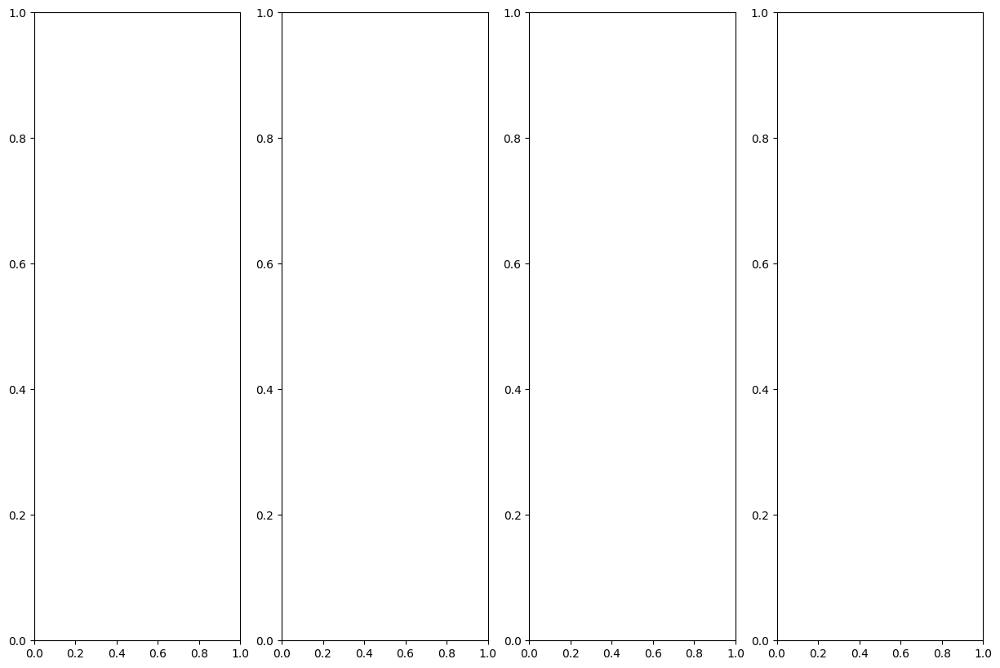

In [18]:
import os
import torch
from PIL import Image
from concurrent.futures import ThreadPoolExecutor

# Assuming you have defined model and device somewhere in your code
# model = ...
# device = ...

def list_image_files(folder):
    # Recursively list all image files in the given folder
    image_files = []
    for root, dirs, files in os.walk(folder):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif')):
                image_files.append(os.path.join(root, file))
    return image_files

def encode_image(image):
    # Implement image encoding logic using CLIP or any other method
    with torch.no_grad():
        # Assuming preprocess is defined elsewhere in your code
        image_preprocessed = preprocess(image).unsqueeze(0).to(device)
        image_feature = model.encode_image(image_preprocessed)
        image_feature /= image_feature.norm(dim=-1, keepdim=True)
    return image_feature

def encode_image_parallel(image_file):
    image = Image.open(image_file)
    return encode_image(image)

def encode_search_query(search_query):
    with torch.no_grad():
        # Assuming clip is defined elsewhere in your code
        text_encoded = model.encode_text(clip.tokenize(search_query).to(device))
        text_encoded /= text_encoded.norm(dim=-1, keepdim=True)

    # Retrieve the feature vector
    return text_encoded

def find_best_matches(text_features, image_features, image_ids, results_count=3):
    # Compute the similarity between the search query and each image using the Cosine similarity
    similarities = (image_features @ text_features.T).squeeze(1)

    # Sort the images by their similarity score
    best_image_idx = (-similarities).argsort()

    # Return the image IDs of the best matches
    return [image_ids[i] for i in best_image_idx[:results_count]]

def encode_image_parallel(image_files):
    images = [Image.open(image_file) for image_file in image_files]
    image_tensors = [preprocess(image).unsqueeze(0).to(device) for image in images]

    with torch.no_grad():
        # Batch processing for image encoding
        image_features = model.encode_image(torch.cat(image_tensors))
        image_features /= image_features.norm(dim=-1, keepdim=True)

    return image_features

def chunks(lst, n):
    """Yield successive n-sized chunks from lst."""
    for i in range(0, len(lst), n):
        yield lst[i:i + n]

def search_in_subfolders(search_query, images_path, image_ids, results_count=3, batch_size=8):
    # Get a list of all image files in the subfolders of the given path
    all_image_files = list_image_files(images_path)

    # Encode the search query
    text_features = encode_search_query(search_query)

    # Placeholder for image features and ids
    subfolder_image_features = []
    subfolder_image_ids = []

    # Use ThreadPoolExecutor for parallel image encoding with batching
    with ThreadPoolExecutor() as executor:
        batch_results = list(executor.map(encode_image_parallel, chunks(all_image_files, batch_size)))

    # Unpack results
    for batch_result in batch_results:
        subfolder_image_features.extend(batch_result)

    subfolder_image_ids = [os.path.splitext(os.path.basename(file))[0] for file in all_image_files]

    # Find the best matches within the subfolders
    return find_best_matches(text_features, subfolder_image_features, subfolder_image_ids, results_count)


# Set the path to the root folder containing subfolders with images
root_images_path = '/Users/tanayparikh/Desktop/Assignment-4/img'

# Search for images and visualize the results
search_queries = ['black tshirt']
n_results_per_query = 3

fig, ax = plt.subplots(len(search_queries), n_results_per_query + 1, figsize=(15, 10))
for i, search_query in enumerate(search_queries):
    result_image_ids = search_in_subfolders(search_query, root_images_path, image_ids, n_results_per_query)

    ax[i, 0].text(0.0, 0.5, search_query)
    ax[i, 0].axis('off')
    for j, image_id in enumerate(result_image_ids):
        image = Image.open(os.path.join(root_images_path, f'{image_id}.jpg'))
        ax[i, j+1].imshow(image)
        ax[i, j+1].axis('off')

plt.show()
